In [1]:
%matplotlib notebook

In [2]:
import autograd.numpy as np
import matplotlib.pyplot as plt
import celerite
from celerite import terms
import emcee
import corner
from scipy import signal
from astropy.io import fits
from IPython.display import display, Math, Image

C:\ProgramData\Anaconda3\lib\site-packages\h5py\__init__.py:72: UserWarning: h5py is running against HDF5 1.10.2 when it was built against 1.10.3, this may cause problems
  '{0}.{1}.{2}'.format(*version.hdf5_built_version_tuple)


In [3]:
dir = "C:/Users/Marc/Documents/stage_m2/stage_m2/plots/TESS_20_21_2/"

<IPython.core.display.Javascript object>


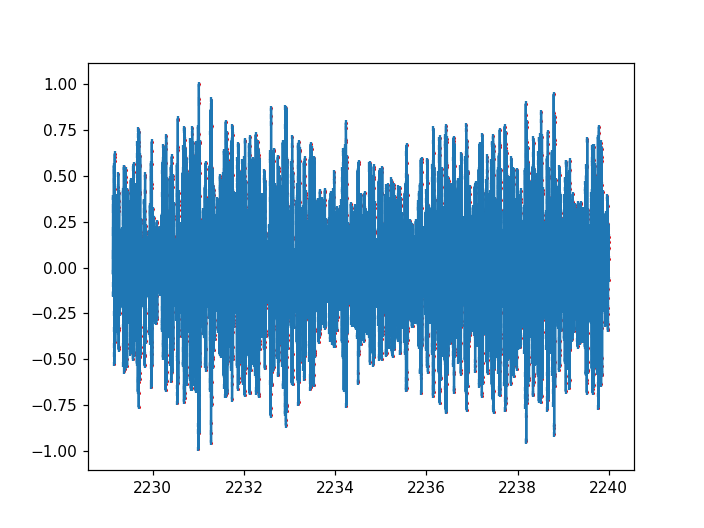

array([-2.260606 ,  6.5866914, 16.381044 , ...,  8.161943 ,  3.7530367,
       -5.2064767], dtype=float32)

In [4]:
### TESS 2020_2021 data import ###
hdul = fits.open("tess2021014023720-s0034-0000000270577175-0204-s_lc.fits")

#SAP_FLUX, PDCSAP_FLUX, SAP_BKG, QUALITY
data = hdul[1].data
time = data['TIME']
flux = data['PDCSAP_FLUX']
flux_error = data['PDCSAP_FLUX_ERR']
index = np.argwhere((time<2240) & (time>2186) & (~np.isnan(flux)) & (data["QUALITY"] == 0))
time = np.ndarray.flatten(time[index])
flux_error = np.ndarray.flatten(flux_error[index])
flux = np.ndarray.flatten(flux[index])
flux_error = flux + flux_error
flux_error = (flux_error - np.mean(flux))/(np.max(flux) - np.mean(flux))
flux = (flux - np.mean(flux))/(np.max(flux) - np.mean(flux))
flux_error = flux_error - flux
plt.figure()
plt.scatter(time,flux,s=1,c='r')
plt.errorbar(time,flux,yerr=flux_error,markersize=1,capsize=0,fmt="-")
plt.show()
flux/flux_error

In [5]:
### GP Model ###
bounds = dict(log_S0= (None,None), log_Q = (-10,10), log_omega0 = (5,7))
#kernel = terms.SHOTerm(log_S0=7., log_Q=2.5, log_omega0=5.)
kernel = terms.SHOTerm(log_S0=1., log_Q=2.5, log_omega0=5.80,bounds=bounds)


gp = celerite.GP(kernel,mean=0.0)
gp.compute(time,yerr=flux_error)


print("Initial log likelihood: {0}".format(gp.log_likelihood(flux)))
print("parameter_dict:\n{0}\n".format(gp.get_parameter_dict()))

Initial log likelihood: -25186.445744125354
parameter_dict:
OrderedDict([('kernel:log_S0', 1.0), ('kernel:log_Q', 2.5), ('kernel:log_omega0', 5.8)])



In [6]:
x = np.linspace(np.min(time),np.max(time),15000)
pred_mean, pred_var = gp.predict(flux, x, return_var=True)
pred_std = np.sqrt(pred_var)

<IPython.core.display.Javascript object>


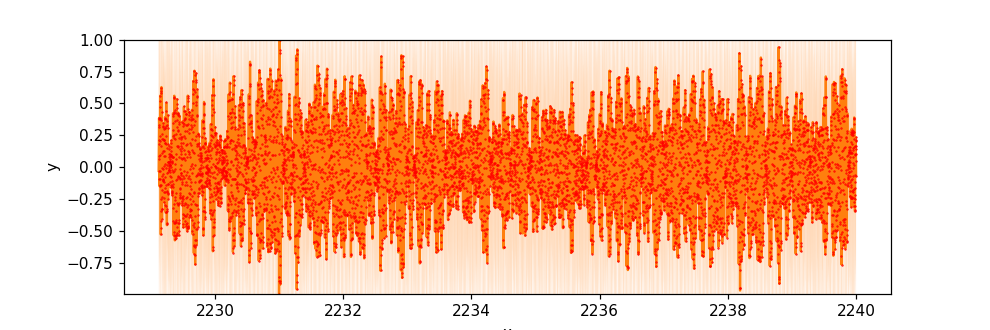

In [7]:
color = "#ff7f0e"
#plt.scatter(time,flux,c="r",s=1)
plt.figure(figsize=(9,3))
plt.errorbar(time,flux,yerr=0,fmt=".r",capsize=0,markersize=1)
plt.plot(x, pred_mean, color=color)
plt.fill_between(x, pred_mean+pred_std, pred_mean-pred_std, color=color, alpha=0.3, edgecolor="none",interpolate=True)
plt.xlabel("x")
plt.ylabel("y")
plt.ylim(np.nanmin(flux),np.nanmax(flux))
plt.show()

In [8]:
### Minimize ###
from scipy.optimize import minimize

def neg_log_like(params, y, gp):
    gp.set_parameter_vector(params)
    return -gp.log_likelihood(y)
# extract our initial guess at parameters
# from the celerite kernel and put it in a 
# vector:
p0 = gp.get_parameter_vector()
bounds = gp.get_parameter_bounds()

# run optimization:
results = minimize(neg_log_like, p0, method='L-BFGS-B',bounds=bounds,args=(flux, gp))
print(results)
print("Final log-likelihood: {0}".format(-results.fun))
print(np.exp(results.x))
print("Parameters: {0}".format(gp.get_parameter_dict()))
gp.set_parameter_vector(results.x)

      fun: -13043.655085651531
 hess_inv: <3x3 LbfgsInvHessProduct with dtype=float64>
      jac: array([ -5.19612513,   6.51052687, -25.13697837])
  message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
     nfev: 156
      nit: 10
   status: 0
  success: True
        x: array([-10.99177035,   2.96267587,   5.73396622])
Final log-likelihood: 13043.655085651531
[1.68397170e-05 1.93496797e+01 3.09193167e+02]
Parameters: OrderedDict([('kernel:log_S0', -10.991770354843151), ('kernel:log_Q', 2.9626758656842846), ('kernel:log_omega0', 5.73396622745648)])


In [9]:
### Prédiction avec les nouveaux paramètres calculés ###
pred_mean, pred_var = gp.predict(flux, x, return_var=True)
pred_std = np.sqrt(pred_var)

<IPython.core.display.Javascript object>


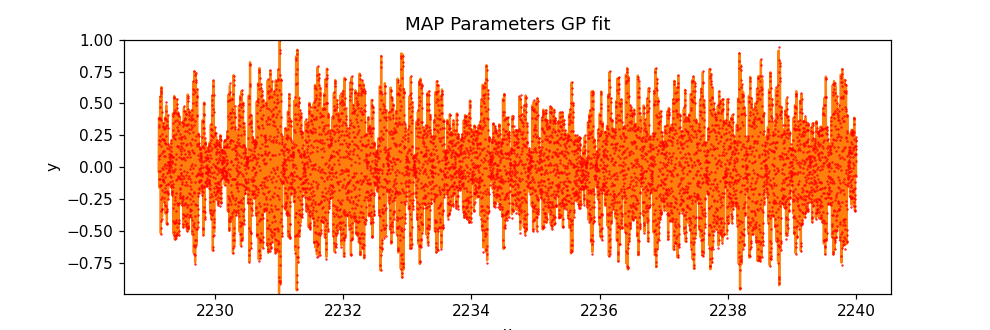

In [10]:
### Plot du posterior du minimize ###
color = "#ff7f0e"
plt.figure(figsize=(9,3))
plt.errorbar(time,flux-np.mean(flux),yerr=0,fmt=".r",capsize=0,markersize=1)
plt.plot(x, pred_mean, color=color)
plt.fill_between(x, pred_mean+pred_std, pred_mean-pred_std, color=color, alpha=0.3, edgecolor="none",interpolate=True)
plt.xlabel("x")
plt.ylabel("y")
plt.ylim(np.min(flux),np.max(flux))
plt.title("MAP Parameters GP fit")
plt.show()
# plt.scatter(x,flux - pred_mean,c='k',s=1)
# plt.axhline(y=0,color='k')
# plt.title("Residuals")
# plt.show()

In [11]:
### Définition de la likelihood ###
def log_likelihood(params,time,flux):
    gp.set_parameter_vector(params)
    ll = gp.log_likelihood(flux)
    return ll if np.isfinite(ll) else -np.inf

In [12]:
### Définition du prior (uniforme) ###
def log_prior(params):
    if ((-30 < params[0] < 10) and (-10 < params[1] < 10) and (5 < params[2] < 7)) :
        return 0
    return -np.inf

In [13]:
### Définition du posterior ###
def log_probability(params,time,flux):
    lp = log_prior(params)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(params,time,flux) if np.isfinite(lp) else -np.inf

In [14]:
### MCMC ###
initial = np.array(results.x)
ndim, nwalkers = len(initial), 128
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability,args=(time,flux))

print("Running burn-in...")
p0 = initial + 1e-4 * np.random.randn(nwalkers, ndim)
p0, lp, _ = sampler.run_mcmc(p0, 500,progress=True)

print("Running production...")
sampler.reset()
sampler.run_mcmc(p0, 5000,progress=True)
print("Finished")

Running burn-in...


100%|██████████| 500/500 [02:15<00:00,  3.70it/s]


Running production...


100%|██████████| 5000/5000 [22:24<00:00,  3.72it/s]

Finished


In [15]:
print("Final MCMC Parameters: {0}".format(gp.get_parameter_dict()))
print("Final MCMC log likelihood: {0}".format(gp.log_likelihood(flux)))

Final MCMC Parameters: OrderedDict([('kernel:log_S0', -11.023877213890367), ('kernel:log_Q', 3.151253989263014), ('kernel:log_omega0', 5.74104156917879)])
Final MCMC log likelihood: 13039.895132724425


In [16]:
w = np.exp(gp.get_parameter_vector())
print(w)
f = w[2]/(2*np.pi)
f

[1.63076340e-05 2.33653461e+01 3.11388575e+02]


49.55903091365621

In [17]:
P = 1/f
print("periode :",P*24*60,"min")

periode : 29.056258232910718 min


In [18]:
pred_mean, pred_var = gp.predict(flux, x, return_var=True)
pred_std = np.sqrt(pred_var)

<IPython.core.display.Javascript object>


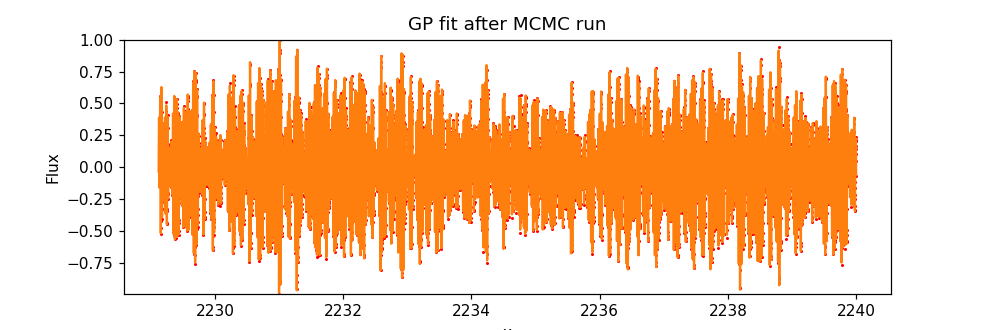

In [19]:
# Plot the data.

# Plot 24 posterior samples.
color = "#ff7f0e"
plt.figure(figsize=(9,3))
plt.scatter(time,flux,c="r",s=1)
plt.plot(x, pred_mean, color=color)
plt.fill_between(x, pred_mean+pred_std, pred_mean-pred_std, color=color, alpha=0.3, edgecolor="none",interpolate=True)
plt.xlabel("x")
plt.ylabel("Flux")
plt.ylim(np.min(flux),np.max(flux))
plt.title("GP fit after MCMC run")
plt.show()

<IPython.core.display.Javascript object>


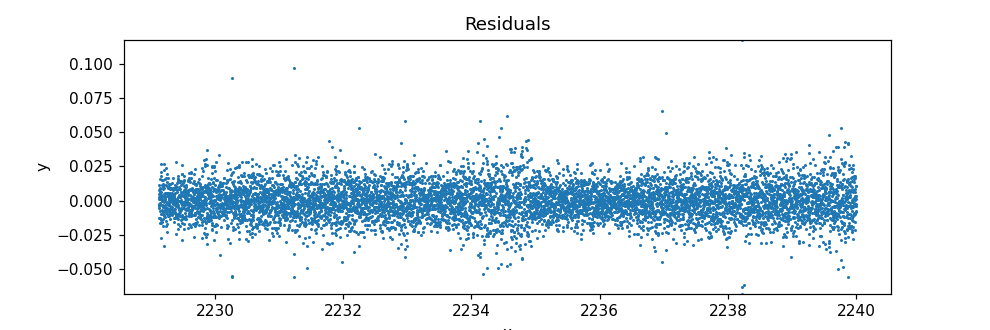

In [20]:
### Résidus ###
pred_mean, pred_var = gp.predict(flux, time, return_var=True)
pred_std = np.sqrt(pred_var)

color = "#ff7f0e"
plt.figure(figsize=(9,3))
plt.scatter(time,flux - pred_mean,s=1)
plt.xlabel("x")
plt.ylabel("y")
plt.ylim(np.min(flux - pred_mean),np.max(flux - pred_mean))
plt.title("Residuals")
plt.show()

<IPython.core.display.Javascript object>


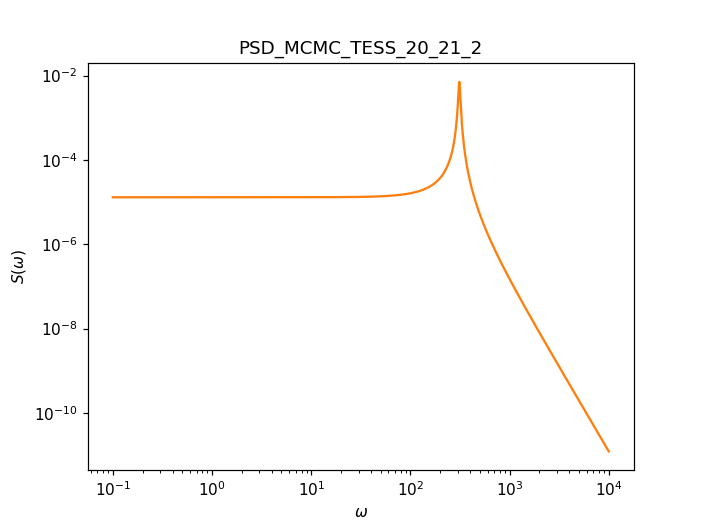

In [21]:
### PSD en fonction de omega ###
color = "#ff7f0e"
plt.figure()
omega = np.exp(np.linspace(np.log(0.1), np.log(10000), 5000))
psd = gp.kernel.get_psd(omega)
plt.plot(omega, psd, color=color)
plt.yscale("log")
plt.xscale("log")
plt.xlabel("$\omega$")
plt.ylabel("$S(\omega)$")
plt.title("PSD_MCMC_TESS_20_21_2")
plt.show()
plt.savefig(dir+"PSD_MCMC_TESS_20_21_2.pdf",bbox_inches='tight')

In [22]:
### Récupération des hyperparamètres et Résultats ###
flat_samples = sampler.get_chain(discard=100, thin=15, flat=True)
labels = ["log(S0)","log(Q)","log(w0)"]
posteriors = []
for i in range(ndim):
    mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
    value = np.percentile(flat_samples[:, i], [50])
    q = np.diff(mcmc)
    txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
    txt = txt.format(mcmc[1], q[0], q[1], labels[i])
    display(Math(txt))
    posteriors.append(value)

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Javascript object>


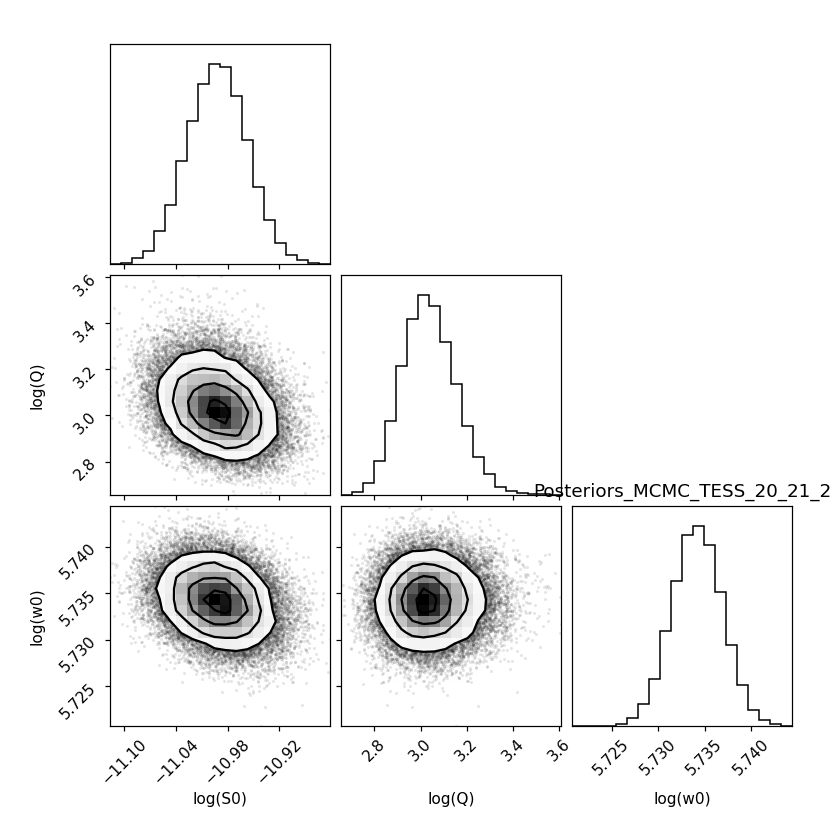

In [23]:
### Posteriors ###
fig = corner.corner(flat_samples, labels=labels, truths=[None,None,np.log(2*np.pi*24*60/30.4)])
plt.title("Posteriors_MCMC_TESS_20_21_2")
plt.show()
plt.savefig(dir+"Posteriors_MCMC_TESS_20_21_2.pdf",bbox_inches='tight')

In [24]:
tau = sampler.get_autocorr_time()
print(tau)

[35.87051637 35.92013112 36.59887966]


<IPython.core.display.Javascript object>


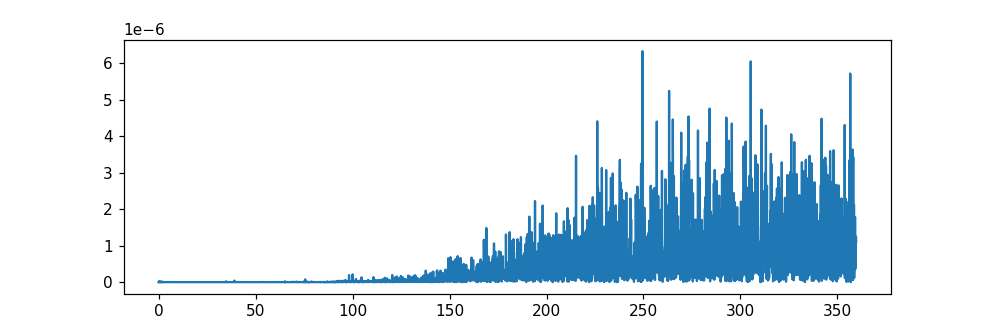

freq: 249.50368356899187 d-1
periode 5.771457877501902 min


In [25]:
### Périodogramme des résidus ###
fs = len(time)/(time[-1] - time[0])
f,pxx = signal.periodogram(flux - pred_mean,fs)
plt.figure(figsize=(9,3))
plt.plot(f,pxx)
plt.show()
idx = np.argmax(pxx)
print("freq:", f[idx],"d-1")
print("periode",1/f[idx]*60*24,"min")

In [26]:
rv_data = np.loadtxt("rv_betapic_carine.txt",usecols=(0,1,2))
rv_time = rv_data[:,0]
rv_flux = rv_data[:,1]
rv_error = rv_data[:,2]
index = np.argwhere(rv_time>=3333)
rv_flux = np.ndarray.flatten(rv_flux[index])
rv_time = np.ndarray.flatten(rv_time[index])
rv_error = np.ndarray.flatten(rv_error[index])

<IPython.core.display.Javascript object>


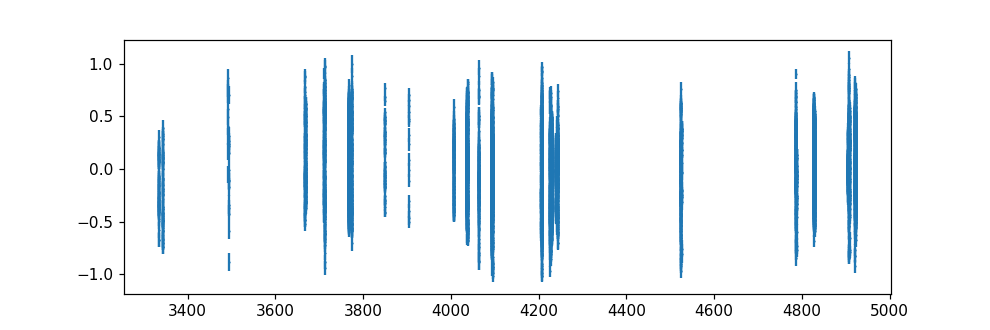

In [27]:
plt.figure(figsize=(9,3))
plt.errorbar(rv_time,rv_flux,yerr=rv_error,markersize=1,capsize=0,fmt='.')
plt.show()

In [28]:
def log_likelihood(params,time,flux):
        gp.set_parameter_vector(params)
        ll = gp.log_likelihood(flux)
        return ll if np.isfinite(ll) else -np.inf

### Définition de la likelihood ###
def log_likelihood(params,time,flux):
    gp.set_parameter_vector(params)
    ll = gp.log_likelihood(flux)
    return ll if np.isfinite(ll) else -np.inf

### Définition du prior (uniforme) ###
def log_prior(params):
    if ((-30 < params[0] < 10) and (-10 < params[1] < 10) and (5 < params[2] < 7) and (-100 < params[3] < 100)) :
        return 0
    return -np.inf

### Définition du posterior ###
def log_probability(params,time,flux):
    lp = log_prior(params)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(params,time,flux) if np.isfinite(lp) else -np.inf

    ### MCMC ###
def run_mcmc(time,flux,gp) :
    initial = gp.get_parameter_vector()
    ndim, nwalkers = len(initial), 128
    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability,args=(time,flux))

    print("Running burn-in...")
    p0 = initial + 1e-8 * np.random.randn(nwalkers, ndim)
    p0, lp, _ = sampler.run_mcmc(p0, 500,progress=True)

    print("Running production...")
    sampler.reset()
    sampler.run_mcmc(p0, 5000,progress=True)
    print("Finished")
    
    likelihood = gp.log_likelihood(flux)
    print("parameter_dict:\n{0}\n".format(gp.get_parameter_dict()))
    print("Final MCMC log likelihood: {0}".format(gp.log_likelihood(flux)))
    return(sampler,likelihood)

In [29]:
def gp_building(posteriors,time,error) :
    bounds = dict(log_S0= (None,None), log_Q = (-10,10), log_omega0 = (5,7))
    #kernel = terms.SHOTerm(log_S0=7., log_Q=2.5, log_omega0=5.)
    kernel = terms.SHOTerm(log_S0=posteriors[0], log_Q=posteriors[1], log_omega0=posteriors[2],bounds=bounds)


    gp = celerite.GP(kernel,fit_mean=True)
    gp.compute(time,yerr=error)

    print("Initial log likelihood: {0}".format(gp.log_likelihood(rv_flux)))
    print("parameter_dict:\n{0}\n".format(gp.get_parameter_dict()))
    
    return gp

In [30]:
file = open("res_TESS_20_21_2_RV_single_obs.txt",'w')
file.write("Borne_inf Borne_sup Likelihood log(S0) log(Q) log(w0) Offset Errors_inf S0,Q,w0,Offset Errors_sup S0,Q,w0,Offset\n")
file.close()

In [31]:
rv_data = np.loadtxt("rv_betapic_carine.txt",usecols=(0,1,2))

bnds = np.array([3320,3340,3492,3494,3666,3668,3711,3712,3713,3768,3769,3770,3771,3772,3773,3774,3849,3905,4007,4035,4036,4038,4039,4060,4093,4094,4095,4206,4207,4208,4226,4227,4228,4229,4230,4231,4238,4239,4242,4243,4244,4525,4786,4787,4789,4827,4828,4829,4905,4906,4908,4909,4921,4922,4923,4924])
# bnds = np.array([3320,3492])
file = open("res_TESS_20_21_2_RV_single_obs.txt",'a')
# bnds = np.array([4206,4209])
for j in range(len(bnds)-1) :
    print(j)
    rv_time = rv_data[:,0]
    rv_flux = rv_data[:,1]
    rv_error = rv_data[:,2]
    index = np.argwhere(rv_time>=3333)
    rv_flux = np.ndarray.flatten(rv_flux[index])
    rv_time = np.ndarray.flatten(rv_time[index])
    rv_error = np.ndarray.flatten(rv_error[index])
    
    ### Data à traiter ###
    index = np.argwhere((rv_time>bnds[j])&(rv_time<bnds[j+1]))
    rv_flux = np.ndarray.flatten(rv_flux[index])
    index = np.argwhere((rv_time>bnds[j])&(rv_time<bnds[j+1]))
    rv_time = np.sort(np.ndarray.flatten(rv_time[index]))
    rv_error = np.ndarray.flatten(rv_error[index])

    gp = gp_building(posteriors,rv_time,rv_error)


    sampler,likelihood = run_mcmc(rv_time,rv_flux,gp)

    ## Posteriors ###
    
    flat_samples = sampler.get_chain(discard = 500, flat=True)
    labels = ["log(S0)","log(Q)","log(w0)","Offset"]

    rv_posteriors = np.array([])
    rv_posteriors_errors = np.array([])
    corner.corner(flat_samples, labels=labels, truths=[None,None,np.log(2*np.pi*24*60/30.4),None])
    plt.title("Posteriors_MCMC_RV_%s_%s_TESS_20_21_2"%(bnds[j],bnds[j+1]))
    plt.savefig(dir+"obs/Posteriors_MCMC_RV_%s_%s_TESS_20_21_2.pdf"%(bnds[j],bnds[j+1]),bbox_inches='tight')
    plt.close()  
    
    
    not_flat_samplers = sampler.get_chain(discard = 500, flat=False)
    fig,ax = plt.subplots(2,2)
    for i in range(not_flat_samplers.shape[2]) :
        for cpt in range(2) :
            for cpt_1 in range(2) :
                if cpt == 0 :
                    ax[cpt,cpt_1].plot(not_flat_samplers[:,i,(cpt)+(cpt_1)],linewidth=0.5)
                    ax[cpt,cpt_1].set_title(labels[(cpt)+(cpt_1)])
                if cpt == 1 :
                    ax[cpt,cpt_1].plot(not_flat_samplers[:,i,(cpt)+(cpt_1+1)],linewidth=0.5)
                    ax[cpt,cpt_1].set_title(labels[(cpt)+(cpt_1+1)])
                    
    plt.savefig(dir+"obs/Samplers_MCMC_RV_%s_%s_TESS_20_21_2.pdf"%(bnds[j],bnds[j+1]),bbox_inches='tight')
    plt.close() 
    
    x = np.linspace(np.min(rv_time),np.max(rv_time),15000)
    pred_mean, pred_var = gp.predict(rv_flux, x, return_var=True)
    pred_std = np.sqrt(pred_var)

    color = "#ff7f0e"
    plt.figure()
    plt.scatter(rv_time,rv_flux,s=1)
    plt.plot(x, pred_mean, color=color)
    plt.fill_between(x, pred_mean+pred_std, pred_mean-pred_std, color=color, alpha=0.3, edgecolor="none",interpolate=True)
    plt.xlabel("x")
    plt.ylabel("y")
    plt.ylim(np.min(rv_flux),np.max(rv_flux))
    plt.title("Fit_MCMC_RV_%s_%s_TESS_20_21_2"%(bnds[j],bnds[j+1]))
    plt.savefig(dir+"obs/Fit_MCMC_RV_%s_%s_TESS_20_21_2.pdf"%(bnds[j],bnds[j+1]),bbox_inches='tight')
    plt.close() 

    for i in range(flat_samples.shape[1]):

        mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
        value = np.percentile(flat_samples[:, i], [50])
        q = np.diff(mcmc)
        txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
        txt = txt.format(mcmc[1], q[0], q[1], labels[i])
        display(Math(txt))
        rv_posteriors = np.append(rv_posteriors,value)
        rv_posteriors_errors = np.append(rv_posteriors_errors,q)
        
    w = np.exp(rv_posteriors[2])
    print(w)
    f = w/(2*np.pi)
    f
    P = 1/f
    
    results = np.array([])
    results = np.append(results,bnds[j])
    results = np.append(results,bnds[j+1])
    results = np.append(results,likelihood)
    results = np.append(results,rv_posteriors)
    results = np.append(results,rv_posteriors_errors)

    print("periode :",P*24*60,"min")
    np.savetxt(file,results.reshape(1, results.shape[0]))
file.close()

  1%|          | 6/500 [00:00<00:09, 54.54it/s]

0
Initial log likelihood: 33.42668485328398
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:27, 57.14it/s]

Running production...


100%|██████████| 5000/5000 [01:26<00:00, 57.54it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.319514646464695), ('kernel:log_Q', 1.500799792256601), ('kernel:log_omega0', 5.469956792598334), ('mean:value', -0.1205916835250112)])

Final MCMC log likelihood: 41.700399618016995


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 51.72it/s]

246.84724199386324
periode : 36.653384373496614 min
1
Initial log likelihood: 38.68318284165846
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:35, 52.17it/s]

Running production...


100%|██████████| 5000/5000 [01:31<00:00, 54.69it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.144023005241095), ('kernel:log_Q', 2.7259681441153667), ('kernel:log_omega0', 5.712314961098085), ('mean:value', -0.1291400315936756)])

Final MCMC log likelihood: 45.7950138883538


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:08, 56.07it/s]

327.35634354027513
periode : 27.638953760569 min
2
Initial log likelihood: 6.602137766757114
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 7/5000 [00:00<01:13, 67.96it/s]

Running production...


100%|██████████| 5000/5000 [01:12<00:00, 68.84it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -5.41794390437015), ('kernel:log_Q', 1.1180095097785676), ('kernel:log_omega0', 5.14235009784087), ('mean:value', -1.2838551024231215)])

Final MCMC log likelihood: 5.425186968191465


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 51.72it/s]

233.17638399612943
periode : 38.80232932374829 min
3
Initial log likelihood: 2.7785420267745966
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 7/5000 [00:00<01:20, 61.94it/s]

Running production...


100%|██████████| 5000/5000 [01:21<00:00, 61.30it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -6.4651522633846605), ('kernel:log_Q', -0.35842910861667665), ('kernel:log_omega0', 5.383691512560085), ('mean:value', -0.02435495853798957)])

Final MCMC log likelihood: 4.495332693027466


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 52.17it/s]

251.75444788910374
periode : 35.93893541187442 min
4
Initial log likelihood: 40.879078956073386
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:33, 53.57it/s]

Running production...


100%|██████████| 5000/5000 [01:32<00:00, 54.25it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.170202909174069), ('kernel:log_Q', 4.506158597477295), ('kernel:log_omega0', 5.704083301321237), ('mean:value', 0.012346082942272088)])

Final MCMC log likelihood: 42.65991249308729


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:09, 49.50it/s]

289.67052329526615
periode : 31.234751604725894 min
5
Initial log likelihood: 70.42526877084316
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:39, 50.00it/s]

Running production...


100%|██████████| 5000/5000 [01:37<00:00, 51.32it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.303658479857859), ('kernel:log_Q', 1.7778584179522179), ('kernel:log_omega0', 5.558168688459191), ('mean:value', 0.07582246160085748)])

Final MCMC log likelihood: 65.00414656867429


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 53.57it/s]

303.3089062541335
periode : 29.830270907896566 min
6
Initial log likelihood: 36.74474593341689
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:32, 54.05it/s]

Running production...


100%|██████████| 5000/5000 [01:31<00:00, 54.65it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.857699527934217), ('kernel:log_Q', 2.362536468721577), ('kernel:log_omega0', 5.590120107463711), ('mean:value', 0.1929328096236801)])

Final MCMC log likelihood: 37.09699987272081


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 50.84it/s]

296.8327444955314
periode : 30.48109418560058 min
7
Initial log likelihood: 49.57213995322448
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:34, 52.63it/s]

Running production...


100%|██████████| 5000/5000 [01:33<00:00, 53.20it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.708817030793139), ('kernel:log_Q', 4.165606015352817), ('kernel:log_omega0', 5.710589281297335), ('mean:value', 0.1381869555627591)])

Final MCMC log likelihood: 68.64444372461932


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 51.28it/s]

304.59317170978346
periode : 29.704496629226277 min
8
Initial log likelihood: 27.970767550228466
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:33, 53.57it/s]

Running production...


100%|██████████| 5000/5000 [01:32<00:00, 53.77it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -8.357745099302685), ('kernel:log_Q', 0.3067768483717144), ('kernel:log_omega0', 5.492858420242894), ('mean:value', -0.2961064722980635)])

Final MCMC log likelihood: 26.467393358788563


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 4/500 [00:00<00:14, 35.09it/s]

271.45424066025964
periode : 33.33079940225513 min
9
Initial log likelihood: 391.97947505974105
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/5000 [00:00<02:19, 35.71it/s]

Running production...


100%|██████████| 5000/5000 [02:17<00:00, 36.35it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.897113830590074), ('kernel:log_Q', 3.091326376273816), ('kernel:log_omega0', 5.6798871076319415), ('mean:value', 0.10042338760088736)])

Final MCMC log likelihood: 416.6756124244637


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 48.07it/s]

292.43969679236886
periode : 30.938983118842792 min
10
Initial log likelihood: 83.73354476831372
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:39, 50.00it/s]

Running production...


100%|██████████| 5000/5000 [01:37<00:00, 51.53it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.98523102579154), ('kernel:log_Q', 3.712824032320702), ('kernel:log_omega0', 5.645083079905279), ('mean:value', 0.1302699737607322)])

Final MCMC log likelihood: 98.88096639227376


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:09, 50.00it/s]

270.87929062125363
periode : 33.40154509998817 min
11
Initial log likelihood: 79.30801430240187
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:36, 51.72it/s]

Running production...


100%|██████████| 5000/5000 [01:34<00:00, 52.97it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.424657930434574), ('kernel:log_Q', 3.746771228847006), ('kernel:log_omega0', 5.617042374047507), ('mean:value', 0.05981343501247653)])

Final MCMC log likelihood: 84.82640545070664


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:09, 50.00it/s]

276.322341132827
periode : 32.74359505368179 min
12
Initial log likelihood: 34.70419140064184
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:34, 52.63it/s]

Running production...


100%|██████████| 5000/5000 [01:33<00:00, 53.71it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.64143924311695), ('kernel:log_Q', 5.814939598571316), ('kernel:log_omega0', 5.701952549249226), ('mean:value', 0.15998306507324372)])

Final MCMC log likelihood: 46.90572381266936


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 49.02it/s]

273.8557556472747
periode : 33.03851263214684 min
13
Initial log likelihood: 84.42023788782862
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:41, 49.02it/s]

Running production...


100%|██████████| 5000/5000 [01:36<00:00, 51.75it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -12.416828204158293), ('kernel:log_Q', 5.168135189539305), ('kernel:log_omega0', 5.734836145234777), ('mean:value', 0.07932289981309613)])

Final MCMC log likelihood: 80.77130974356766


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:09, 50.00it/s]

289.57284106159426
periode : 31.24528809113723 min
14
Initial log likelihood: 65.20793951776844
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:37, 51.28it/s]

Running production...


100%|██████████| 5000/5000 [01:34<00:00, 53.07it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -9.97664600743021), ('kernel:log_Q', 2.114384431631718), ('kernel:log_omega0', 5.526250175404045), ('mean:value', 0.07845450133884667)])

Final MCMC log likelihood: 72.46607255539149


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 53.09it/s]

265.02300481483064
periode : 34.13962817552468 min
15
Initial log likelihood: 31.764768937838
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:31, 54.54it/s]

Running production...


100%|██████████| 5000/5000 [01:29<00:00, 55.86it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.926870856443717), ('kernel:log_Q', 4.702369138353588), ('kernel:log_omega0', 5.73303898092174), ('mean:value', 0.113655808632376)])

Final MCMC log likelihood: 35.707446823647246


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 51.72it/s]

300.82613534381994
periode : 30.076465370928346 min
16
Initial log likelihood: 28.768933612930233
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:34, 53.09it/s]

Running production...


100%|██████████| 5000/5000 [01:32<00:00, 54.13it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.662465306836067), ('kernel:log_Q', 5.633211971781881), ('kernel:log_omega0', 5.65191930222772), ('mean:value', 0.12449099341977143)])

Final MCMC log likelihood: 44.87669832094981


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 54.05it/s]

309.2763773796364
periode : 29.25469742951773 min
17
Initial log likelihood: 12.138840842665617
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 7/5000 [00:00<01:21, 61.40it/s]

Running production...


100%|██████████| 5000/5000 [01:19<00:00, 62.58it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -15.915461542001768), ('kernel:log_Q', 7.014658202063278), ('kernel:log_omega0', 5.806156550342606), ('mean:value', 0.09438674446737552)])

Final MCMC log likelihood: 13.287620737035672


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 49.02it/s]

331.0292560516476
periode : 27.332287636011717 min
18
Initial log likelihood: 57.85442092168928
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:38, 50.84it/s]

Running production...


100%|██████████| 5000/5000 [01:37<00:00, 51.32it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -9.445610674648428), ('kernel:log_Q', 3.0287261599743927), ('kernel:log_omega0', 5.630493040778341), ('mean:value', -0.027149323354269603)])

Final MCMC log likelihood: 51.15068401650102


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 4/500 [00:00<00:12, 40.00it/s]

322.2497009054439
periode : 28.0769441117137 min
19
Initial log likelihood: 240.45237027724326
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<02:00, 41.32it/s]

Running production...


100%|██████████| 5000/5000 [01:59<00:00, 41.70it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.706562611993697), ('kernel:log_Q', 2.171130388317035), ('kernel:log_omega0', 5.625147734325852), ('mean:value', 0.048059356031511104)])

Final MCMC log likelihood: 246.24616464061793


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 45.87it/s]

284.47365105492133
periode : 31.805359859468364 min
20
Initial log likelihood: 109.4674190992579
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:46, 46.73it/s]

Running production...


100%|██████████| 5000/5000 [01:43<00:00, 48.18it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.485670977541782), ('kernel:log_Q', 2.700039691207862), ('kernel:log_omega0', 5.710746590786288), ('mean:value', 0.06197890602136365)])

Final MCMC log likelihood: 107.7787066440825


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 47.17it/s]

302.33521390644876
periode : 29.926341445420416 min
21
Initial log likelihood: 83.16260358249555
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:41, 49.02it/s]

Running production...


100%|██████████| 5000/5000 [01:38<00:00, 50.70it/s]


Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.462227505525558), ('kernel:log_Q', 6.201171440205826), ('kernel:log_omega0', 5.73055326764838), ('mean:value', 0.05813498104191983)])

Final MCMC log likelihood: 85.53934492074593


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 49.02it/s]

306.72192385064415
periode : 29.498337545458128 min
22
Initial log likelihood: 78.6388887441599
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:39, 50.42it/s]

Running production...


100%|██████████| 5000/5000 [01:36<00:00, 51.63it/s]


Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.012340477268218), ('kernel:log_Q', 3.3312753560576365), ('kernel:log_omega0', 5.692373896907039), ('mean:value', 0.06388006413799983)])

Final MCMC log likelihood: 83.06279034781873


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 45.45it/s]

301.2612851924537
periode : 30.03302212084316 min
23
Initial log likelihood: 68.39719016680739
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:40, 49.50it/s]

Running production...


100%|██████████| 5000/5000 [01:38<00:00, 50.91it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.385159988055353), ('kernel:log_Q', 4.1688460636395055), ('kernel:log_omega0', 5.6736003998533375), ('mean:value', -0.06694299100055842)])

Final MCMC log likelihood: 71.05652429801076


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 4/500 [00:00<00:13, 38.09it/s]

298.3661086561793
periode : 30.3244456385788 min
24
Initial log likelihood: 271.8386972789462
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/5000 [00:00<02:08, 38.83it/s]

Running production...


100%|██████████| 5000/5000 [02:06<00:00, 39.47it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.754424554398028), ('kernel:log_Q', 3.122258714973191), ('kernel:log_omega0', 5.7319445173713905), ('mean:value', -0.035843533944098026)])

Final MCMC log likelihood: 278.35923416908446


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 4/500 [00:00<00:13, 37.03it/s]

307.1631107580464
periode : 29.45596826392861 min
25
Initial log likelihood: 288.07562976303353
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/5000 [00:00<02:13, 37.38it/s]

Running production...


100%|██████████| 5000/5000 [02:10<00:00, 38.32it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -9.879676982907235), ('kernel:log_Q', 1.735548609350835), ('kernel:log_omega0', 5.666014003076027), ('mean:value', -0.06119734031135485)])

Final MCMC log likelihood: 301.1328484050693


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 4/500 [00:00<00:12, 39.60it/s]

298.2467397923531
periode : 30.336582551205424 min
26
Initial log likelihood: 206.53034240483535
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/5000 [00:00<02:06, 39.60it/s]

Running production...


100%|██████████| 5000/5000 [02:00<00:00, 41.54it/s]


Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.725921705832398), ('kernel:log_Q', 3.352403294451576), ('kernel:log_omega0', 5.7261546259198335), ('mean:value', -0.055681890313204856)])

Final MCMC log likelihood: 218.52940105401038


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 47.17it/s]

308.5885769757587
periode : 29.319902022975263 min
27
Initial log likelihood: 107.97145797730909
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:42, 48.54it/s]

Running production...


100%|██████████| 5000/5000 [01:40<00:00, 49.62it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.096378711742547), ('kernel:log_Q', 3.9039059232475726), ('kernel:log_omega0', 5.733108066343642), ('mean:value', -0.024101571881943677)])

Final MCMC log likelihood: 109.40302704366644


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 4/500 [00:00<00:16, 29.20it/s]

299.9036025100483
periode : 30.16898352208176 min
28
Initial log likelihood: 148.4698417741017
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:46, 46.73it/s]

Running production...


100%|██████████| 5000/5000 [01:44<00:00, 47.87it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.61141667686617), ('kernel:log_Q', 3.7016608988238127), ('kernel:log_omega0', 5.708568141309369), ('mean:value', -0.028972049293894787)])

Final MCMC log likelihood: 149.47897436012434


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:11, 42.01it/s]

304.70068463252153
periode : 29.694015467180574 min
29
Initial log likelihood: 123.92550712714822
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:49, 45.45it/s]

Running production...


100%|██████████| 5000/5000 [01:47<00:00, 46.53it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.319017868617815), ('kernel:log_Q', 3.224004468344121), ('kernel:log_omega0', 5.67380881552469), ('mean:value', -0.03401404373896638)])

Final MCMC log likelihood: 118.63403456682423


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 47.62it/s]

307.4016862454714
periode : 29.43310738742538 min
30
Initial log likelihood: 98.8119017696321
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:41, 49.02it/s]

Running production...


100%|██████████| 5000/5000 [01:38<00:00, 50.94it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.6321695302825), ('kernel:log_Q', 4.593516380319712), ('kernel:log_omega0', 5.61879843534059), ('mean:value', -0.06808997569908325)])

Final MCMC log likelihood: 114.15850133728256


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 48.07it/s]

284.5241872192769
periode : 31.79971070566898 min
31
Initial log likelihood: 55.27764972032442
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:39, 50.00it/s]

Running production...


100%|██████████| 5000/5000 [01:36<00:00, 51.82it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.3444766334082), ('kernel:log_Q', 3.226324177373495), ('kernel:log_omega0', 5.764560545734424), ('mean:value', -0.08642270954242529)])

Final MCMC log likelihood: 62.12877336785708


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 47.62it/s]

324.33582094209703
periode : 27.896353896580194 min
32
Initial log likelihood: 73.69385302294252
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:40, 49.50it/s]

Running production...


100%|██████████| 5000/5000 [01:38<00:00, 50.69it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.667734980515283), ('kernel:log_Q', 2.697296501226011), ('kernel:log_omega0', 5.77003347475025), ('mean:value', -0.1503030043514621)])

Final MCMC log likelihood: 93.34802953329314


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 48.54it/s]

308.35293551327993
periode : 29.342308116113074 min
33
Initial log likelihood: 67.9807012042686
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:40, 49.50it/s]

Running production...


100%|██████████| 5000/5000 [01:36<00:00, 51.91it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -12.678409685037822), ('kernel:log_Q', 5.112878473801603), ('kernel:log_omega0', 5.720961749353025), ('mean:value', -0.07574303033842159)])

Final MCMC log likelihood: 77.869677064087


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/500 [00:00<?, ?it/s]

299.58048771247167
periode : 30.201522507108006 min
34
Initial log likelihood: 89.92851462643048
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:40, 49.50it/s]

Running production...


100%|██████████| 5000/5000 [01:38<00:00, 50.59it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.209181338694448), ('kernel:log_Q', 5.579450495437366), ('kernel:log_omega0', 5.761516519678057), ('mean:value', -0.04818713563818315)])

Final MCMC log likelihood: 92.82171543960428


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 51.72it/s]

298.9622588976344
periode : 30.263976716327242 min
35
Initial log likelihood: 31.500887631015758
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:33, 53.57it/s]

Running production...


100%|██████████| 5000/5000 [01:32<00:00, 54.29it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.006337452132342), ('kernel:log_Q', 2.0562671687688), ('kernel:log_omega0', 5.796978455669294), ('mean:value', -0.02108531759442782)])

Final MCMC log likelihood: 31.88591634059854


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 50.84it/s]

311.7018210257647
periode : 29.02705801513662 min
36
Initial log likelihood: 33.411639894988376
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:33, 53.57it/s]

Running production...


100%|██████████| 5000/5000 [01:27<00:00, 57.09it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -7.085611481398432), ('kernel:log_Q', -2.1228633078712726), ('kernel:log_omega0', 5.732290608378029), ('mean:value', -0.0738631117722003)])

Final MCMC log likelihood: 18.777579141426116


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 51.72it/s]

336.18421405688224
periode : 26.913181714141174 min
37
Initial log likelihood: 20.36187888127193
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 7/5000 [00:00<01:22, 60.34it/s]

Running production...


100%|██████████| 5000/5000 [01:22<00:00, 60.68it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -14.374160460990097), ('kernel:log_Q', 5.394265368780022), ('kernel:log_omega0', 5.788242942764581), ('mean:value', -0.12901781444782529)])

Final MCMC log likelihood: 26.338800593445715


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 49.02it/s]

330.7982612818648
periode : 27.351373635634726 min
38
Initial log likelihood: 70.51878410914263
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:38, 50.84it/s]

Running production...


100%|██████████| 5000/5000 [01:35<00:00, 52.19it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.318984208287414), ('kernel:log_Q', 3.8918941849469446), ('kernel:log_omega0', 5.627322203838214), ('mean:value', -0.08007772479707455)])

Final MCMC log likelihood: 76.7358025463278


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:09, 49.50it/s]

283.16781302201775
periode : 31.952031361823924 min
39
Initial log likelihood: 63.111392687864665
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:37, 51.28it/s]

Running production...


100%|██████████| 5000/5000 [01:35<00:00, 52.46it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.083708529341214), ('kernel:log_Q', 4.992555688287733), ('kernel:log_omega0', 5.747361943966785), ('mean:value', -0.08724208879831874)])

Final MCMC log likelihood: 66.89779019597363


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:09, 49.50it/s]

312.18213302989113
periode : 28.982398046054378 min
40
Initial log likelihood: 57.37061407172846
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:36, 51.72it/s]

Running production...


100%|██████████| 5000/5000 [01:33<00:00, 53.21it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.862552735805354), ('kernel:log_Q', 5.240333607832002), ('kernel:log_omega0', 5.676220766387286), ('mean:value', 0.05195791728288604)])

Final MCMC log likelihood: 51.407653111883896


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:11, 42.37it/s]

310.200206485036
periode : 29.16757195251921 min
41
Initial log likelihood: 146.95928241802972
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:55, 43.10it/s]

Running production...


100%|██████████| 5000/5000 [01:51<00:00, 44.96it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -9.848335821060788), ('kernel:log_Q', 2.896341787960334), ('kernel:log_omega0', 5.741140242962309), ('mean:value', -0.04711143504477079)])

Final MCMC log likelihood: 158.35905500715933


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 46.73it/s]

299.83316182180425
periode : 30.176071210281446 min
42
Initial log likelihood: 92.73291368260516
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:43, 48.07it/s]

Running production...


100%|██████████| 5000/5000 [01:41<00:00, 49.37it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.149254025843831), ('kernel:log_Q', 3.3545168435682604), ('kernel:log_omega0', 5.7130889312939255), ('mean:value', 0.049866084203307647)])

Final MCMC log likelihood: 104.23311520515864


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 51.28it/s]

300.36717677268376
periode : 30.122421962190362 min
43
Initial log likelihood: 33.29056084377261
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:36, 51.72it/s]

Running production...


100%|██████████| 5000/5000 [01:35<00:00, 52.57it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -9.503095334419243), ('kernel:log_Q', 2.56197311681374), ('kernel:log_omega0', 5.712854139726625), ('mean:value', -0.051964637370729296)])

Final MCMC log likelihood: 45.39642603279812


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 53.09it/s]

307.48249170496786
periode : 29.425372456718723 min
44
Initial log likelihood: -10.289176440401032
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 7/5000 [00:00<01:19, 62.50it/s]

Running production...


100%|██████████| 5000/5000 [01:19<00:00, 63.28it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -13.484352013790005), ('kernel:log_Q', 1.74775626375083), ('kernel:log_omega0', 6.986323196786738), ('mean:value', -0.10003381451951296)])

Final MCMC log likelihood: 17.40086370227142


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 4/500 [00:00<00:12, 39.60it/s]

1015.2807895555962
periode : 8.91161039922656 min
45
Initial log likelihood: 215.41969727956365
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<02:01, 40.98it/s]

Running production...


100%|██████████| 5000/5000 [01:59<00:00, 41.92it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.72833745405126), ('kernel:log_Q', 3.622906474331833), ('kernel:log_omega0', 5.7666527969984145), ('mean:value', 0.041165931001778094)])

Final MCMC log likelihood: 215.36848387823778


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 4/500 [00:00<00:13, 38.09it/s]

310.9371619526594
periode : 29.098441580669416 min
46
Initial log likelihood: 250.57489979483913
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/5000 [00:00<02:07, 39.21it/s]

Running production...


100%|██████████| 5000/5000 [02:03<00:00, 40.58it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.414476912843526), ('kernel:log_Q', 1.8402668402349063), ('kernel:log_omega0', 5.638192101998096), ('mean:value', 0.027848665130482904)])

Final MCMC log likelihood: 254.92258613548583


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 4/500 [00:00<00:12, 38.83it/s]

300.75959917460796
periode : 30.08311909966954 min
47
Initial log likelihood: 299.9754836595317
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/5000 [00:00<02:04, 40.00it/s]

Running production...


100%|██████████| 5000/5000 [02:01<00:00, 41.29it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.986786453543814), ('kernel:log_Q', 2.791079097384343), ('kernel:log_omega0', 5.743710400153808), ('mean:value', 0.01052539204725389)])

Final MCMC log likelihood: 300.4683089794043


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:11, 43.10it/s]

312.80492281950274
periode : 28.92469453736645 min
48
Initial log likelihood: 75.82241662406166
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:39, 50.00it/s]

Running production...


100%|██████████| 5000/5000 [01:35<00:00, 52.19it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.885824549971021), ('kernel:log_Q', 3.474971532737338), ('kernel:log_omega0', 5.794308593990953), ('mean:value', 0.00010357694382636534)])

Final MCMC log likelihood: 74.09580416545465


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 47.17it/s]

294.6598408212109
periode : 30.705870257455548 min
49
Initial log likelihood: 96.99447209508814
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:39, 50.00it/s]

Running production...


100%|██████████| 5000/5000 [01:37<00:00, 51.15it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -12.948716565841604), ('kernel:log_Q', 5.870005887607846), ('kernel:log_omega0', 5.613764488066542), ('mean:value', 0.11022128556374701)])

Final MCMC log likelihood: 114.44014624306665


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 48.54it/s]

275.04840830531947
periode : 32.895252505133726 min
50
Initial log likelihood: 82.71152080281533
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:38, 50.84it/s]

Running production...


100%|██████████| 5000/5000 [01:36<00:00, 51.76it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.551937763866842), ('kernel:log_Q', 5.366744698426983), ('kernel:log_omega0', 5.712683453766851), ('mean:value', 0.04493584311861511)])

Final MCMC log likelihood: 84.66972742324486


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/500 [00:00<?, ?it/s]

312.03049579341206
periode : 28.996482601267694 min
51
Initial log likelihood: 52.10053125793518
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:34, 53.09it/s]

Running production...


100%|██████████| 5000/5000 [01:32<00:00, 54.29it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.37465551053602), ('kernel:log_Q', -0.2728344350366383), ('kernel:log_omega0', 5.777050653355464), ('mean:value', 0.05748521898377102)])

Final MCMC log likelihood: 32.55449252112535


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:11, 41.66it/s]

275.189811813342
periode : 32.878349611560516 min
52
Initial log likelihood: 207.51836953385293
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:56, 42.73it/s]

Running production...


100%|██████████| 5000/5000 [01:54<00:00, 43.82it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.126363940851954), ('kernel:log_Q', 4.32356274678788), ('kernel:log_omega0', 5.802978087639973), ('mean:value', 0.10332428676923573)])

Final MCMC log likelihood: 224.82825334215897


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 46.29it/s]

320.23400111602757
periode : 28.253673285181225 min
53
Initial log likelihood: 117.60778976693375
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:47, 46.29it/s]

Running production...


100%|██████████| 5000/5000 [01:43<00:00, 48.23it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.37234939893695), ('kernel:log_Q', 2.9617128014185172), ('kernel:log_omega0', 5.53810664267818), ('mean:value', 0.03722888680044667)])

Final MCMC log likelihood: 119.46998192839162


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:12, 40.32it/s]

270.2005007066274
periode : 33.48545549944157 min
54
Initial log likelihood: 200.69972432727633
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<02:00, 41.32it/s]

Running production...


100%|██████████| 5000/5000 [01:57<00:00, 42.70it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.393088742195209), ('kernel:log_Q', 2.8681906504877404), ('kernel:log_omega0', 5.780783323504239), ('mean:value', 0.03552252347796861)])

Final MCMC log likelihood: 211.22942582084858


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

325.6484963806972
periode : 27.783904863363315 min


In [32]:
file = open("res_TESS_20_21_2_RV_groups_moy_single_obs.txt",'w')
file.write("Borne_inf Borne_sup Likelihood log(S0) log(Q) log(w0) Offset Errors_inf S0,Q,w0,Offset Errors_sup S0,Q,w0,Offset\n")
file.close()

In [33]:
results_data = np.loadtxt("res_TESS_20_21_2_RV_single_obs.txt",usecols=(3,4,5,6,7,8,9,10,11,12,13,14),skiprows=1)
bnds = np.array([3320,3340,3492,3494,3666,3668,3711,3712,3713,3768,3769,3770,3771,3772,3773,3774,3849,3905,4007,4035,4036,4038,4039,4060,4093,4094,4095,4206,4207,4208,4226,4227,4228,4229,4230,4231,4238,4239,4242,4243,4244,4525,4786,4787,4789,4827,4828,4829,4905,4906,4908,4909,4921,4922,4923,4924])
groups_bnds = np.array([3320,3340,3492,3666,3711,3768,3849,3905,4007,4035,4060,4093,4206,4226,4238,4525,4786,4827,4905,4921,4924])
indexes = np.array([])
file = open("res_TESS_20_21_2_RV_groups_moy_single_obs.txt",'a')
for i in range(len(groups_bnds)) :
    index = np.argwhere(groups_bnds[i] == bnds)
    indexes = np.append(indexes,index)
    
indexes = np.ndarray.flatten(np.array(indexes)).astype(int)


for i in range(len(indexes)-1) :
    moyenne = np.mean(results_data[indexes[i]:indexes[i+1],0:3],axis=0)
    moyenne_errors = np.mean(results_data[indexes[i]:indexes[i+1],3:],axis=0)
    results = np.array([])
    results = np.append(results,bnds[indexes[i]])
    results = np.append(results,bnds[indexes[i+1]])
    results = np.append(results,0)
    results = np.append(results,moyenne)
    results = np.append(results,moyenne_errors)
    np.savetxt(file,results.reshape(1, results.shape[0]))
file.close()

In [34]:
file = open("res_TESS_20_21_2_RV_groups_obs.txt",'w')
file.write("Borne_inf Borne_sup Likelihood log(S0) log(Q) log(w0) Offset Errors_inf S0,Q,w0,Offset Errors_sup S0,Q,w0,Offset\n")
file.close()

In [35]:
rv_data = np.loadtxt("rv_betapic_carine.txt",usecols=(0,1,2))

groups_bnds = np.array([3320,3340,3492,3666,3711,3768,3849,3905,4007,4035,4060,4093,4206,4226,4238,4525,4786,4827,4905,4921,4924])
file = open("res_TESS_20_21_2_RV_groups_obs.txt",'a')
for j in range(len(groups_bnds)-1) :
    print(j)
    rv_time = rv_data[:,0]
    rv_flux = rv_data[:,1]
    rv_error = rv_data[:,2]
    index = np.argwhere(rv_time>=3333)
    rv_flux = np.ndarray.flatten(rv_flux[index])
    rv_time = np.ndarray.flatten(rv_time[index])
    rv_error = np.ndarray.flatten(rv_error[index])
    
    
    ### Data à traiter ###
    index = np.argwhere((rv_time>groups_bnds[j])&(rv_time<groups_bnds[j+1]))
    rv_flux = np.ndarray.flatten(rv_flux[index])
    index = np.argwhere((rv_time>groups_bnds[j])&(rv_time<groups_bnds[j+1]))
    rv_time = np.sort(np.ndarray.flatten(rv_time[index]))
    rv_error = np.ndarray.flatten(rv_error[index])
    
    gp = gp_building(posteriors,rv_time,rv_error)


    sampler,likelihood = run_mcmc(rv_time,rv_flux,gp)

    ## Posteriors ###
    flat_samples = sampler.get_chain(flat=True)
    labels = ["log(S0)","log(Q)","log(w0)","Offset"]

    rv_posteriors = np.array([])
    rv_posteriors_errors = np.array([])
    fig = corner.corner(flat_samples, labels=labels, truths=[None,None,np.log(2*np.pi*24*60/30.4),None])
    plt.title("Posteriors_MCMC_grp_RV_%s_%s_TESS_20_21_2"%(groups_bnds[j],groups_bnds[j+1]))
    plt.savefig(dir+"grp/Posteriors_MCMC_grp_RV_%s_%s_TESS_20_21_2.pdf"%(groups_bnds[j],groups_bnds[j+1]),bbox_inches='tight')
    plt.close()  
    
    
    not_flat_samplers = sampler.get_chain(flat=False)
    fig,ax = plt.subplots(2,2)
    for i in range(not_flat_samplers.shape[2]) :
        for cpt in range(2) :
            for cpt_1 in range(2) :
                if cpt == 0 :
                    ax[cpt,cpt_1].plot(not_flat_samplers[:,i,(cpt)+(cpt_1)],linewidth=0.5)
                    ax[cpt,cpt_1].set_title(labels[(cpt)+(cpt_1)])
                if cpt == 1 :
                    ax[cpt,cpt_1].plot(not_flat_samplers[:,i,(cpt)+(cpt_1+1)],linewidth=0.5)
                    ax[cpt,cpt_1].set_title(labels[(cpt)+(cpt_1+1)])
                    
    plt.savefig(dir+"grp/Samplers_MCMC_grp_RV_%s_%s_TESS_20_21_2.pdf"%(groups_bnds[j],groups_bnds[j+1]),bbox_inches='tight')
    plt.close() 
    
    
    x = np.linspace(np.min(rv_time),np.max(rv_time),15000)
    pred_mean, pred_var = gp.predict(rv_flux, x, return_var=True)
    pred_std = np.sqrt(pred_var)

    color = "#ff7f0e"
    plt.figure()
    plt.scatter(rv_time,rv_flux,s=1)
    plt.plot(x, pred_mean, color=color)
    plt.fill_between(x, pred_mean+pred_std, pred_mean-pred_std, color=color, alpha=0.3, edgecolor="none",interpolate=True)
    plt.xlabel("x")
    plt.ylabel("y")
    plt.ylim(np.min(rv_flux),np.max(rv_flux))
    plt.title("Fit_MCMC_grp_RV_%s_%s_TESS_20_21_2"%(groups_bnds[j],groups_bnds[j+1]))
    plt.savefig(dir+"grp/Fit_MCMC_grp_RV_%s_%s_TESS_20_21_2.pdf"%(groups_bnds[j],groups_bnds[j+1]),bbox_inches='tight')
    plt.close() 

    for i in range(flat_samples.shape[1]):

        mcmc = np.percentile(flat_samples[:, i], [16, 50, 84])
        value = np.percentile(flat_samples[:, i], [50])
        q = np.diff(mcmc)
        txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
        txt = txt.format(mcmc[1], q[0], q[1], labels[i])
        display(Math(txt))
        rv_posteriors = np.append(rv_posteriors,value)
        rv_posteriors_errors = np.append(rv_posteriors_errors,q)
        
    w = np.exp(rv_posteriors[2])
    print(w)
    f = w/(2*np.pi)
    f
    P = 1/f
    
    results = np.array([])
    results = np.append(results,groups_bnds[j])
    results = np.append(results,groups_bnds[j+1])
    results = np.append(results,likelihood)
    results = np.append(results,rv_posteriors)
    results = np.append(results,rv_posteriors_errors)

    print("periode :",P*24*60,"min")
    np.savetxt(file,results.reshape(1, results.shape[0]))
file.close()

  0%|          | 0/500 [00:00<?, ?it/s]

0
Initial log likelihood: 33.42668485328398
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:42, 48.54it/s]

Running production...


100%|██████████| 5000/5000 [01:29<00:00, 56.14it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -8.990272093593319), ('kernel:log_Q', 3.749867256591299), ('kernel:log_omega0', 5.927338936747063), ('mean:value', -0.13006357109367322)])

Final MCMC log likelihood: 36.50429648686421


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/500 [00:00<?, ?it/s]

245.51708916780754
periode : 36.851963637262614 min
1
Initial log likelihood: 38.68318284165846
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:34, 52.63it/s]

Running production...


100%|██████████| 5000/5000 [01:31<00:00, 54.44it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -9.633466112412679), ('kernel:log_Q', 3.003277627549524), ('kernel:log_omega0', 5.692324550120886), ('mean:value', -0.2043551151990194)])

Final MCMC log likelihood: 44.394061680394906


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 54.05it/s]

327.2787645443448
periode : 27.64550536890293 min
2
Initial log likelihood: 9.380678664041152
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:26, 57.69it/s]

Running production...


100%|██████████| 5000/5000 [01:22<00:00, 60.58it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -7.093254941656593), ('kernel:log_Q', 0.3946417601317871), ('kernel:log_omega0', 5.779603472612194), ('mean:value', 0.263830281056883)])

Final MCMC log likelihood: 10.553530512256476


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:11, 44.64it/s]

247.6941658505505
periode : 36.528057943026816 min
3
Initial log likelihood: 111.30434749325656
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:47, 46.29it/s]

Running production...


100%|██████████| 5000/5000 [01:44<00:00, 47.67it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.384766832907733), ('kernel:log_Q', 3.6085499373367873), ('kernel:log_omega0', 5.7348106713054605), ('mean:value', 0.11229434980137268)])

Final MCMC log likelihood: 123.86475088500438


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:11, 43.86it/s]

297.0127256970289
periode : 30.462623515895743 min
4
Initial log likelihood: 114.28872345954733
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:54, 43.48it/s]

Running production...


100%|██████████| 5000/5000 [01:51<00:00, 44.67it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.560379333672845), ('kernel:log_Q', 6.252334663747218), ('kernel:log_omega0', 5.672155611676633), ('mean:value', 0.014655506093190357)])

Final MCMC log likelihood: 127.00302675492162


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  0%|          | 0/500 [00:00<?, ?it/s]

288.8409293508569
periode : 31.32446243914483 min
5
Initial log likelihood: 771.1143932350146
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 3/5000 [00:00<03:19, 25.00it/s]

Running production...


100%|██████████| 5000/5000 [03:16<00:00, 25.38it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.270279443852635), ('kernel:log_Q', 3.214687257774885), ('kernel:log_omega0', 5.6648349040880515), ('mean:value', 0.09119891399222485)])

Final MCMC log likelihood: 836.029207063503


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 51.28it/s]

288.54618920263545
periode : 31.356459315373854 min
6
Initial log likelihood: 28.768933612930233
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 6/5000 [00:00<01:34, 52.63it/s]

Running production...


100%|██████████| 5000/5000 [01:32<00:00, 53.82it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.450228316138078), ('kernel:log_Q', 3.931192685981854), ('kernel:log_omega0', 5.808556344933184), ('mean:value', 0.17332989469590993)])

Final MCMC log likelihood: 50.61605495584609


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 6/500 [00:00<00:09, 54.54it/s]

309.5403449926876
periode : 29.229749816788317 min
7
Initial log likelihood: 12.138840842665617
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 7/5000 [00:00<01:22, 60.87it/s]

Running production...


100%|██████████| 5000/5000 [01:19<00:00, 63.19it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.025007894869788), ('kernel:log_Q', 2.338066549666479), ('kernel:log_omega0', 5.687958624554417), ('mean:value', -0.0040523881804230555)])

Final MCMC log likelihood: 10.122103774687245


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 46.29it/s]

331.0676582035819
periode : 27.32911723069878 min
8
Initial log likelihood: 57.85442092168928
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:39, 50.00it/s]

Running production...


100%|██████████| 5000/5000 [01:38<00:00, 50.96it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.7098426846768), ('kernel:log_Q', 3.054035091748521), ('kernel:log_omega0', 5.760624886430917), ('mean:value', 0.009835645660867443)])

Final MCMC log likelihood: 57.740174509268414


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

322.564465628374
periode : 28.049546079767335 min
9
Initial log likelihood: 511.711382635731
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 3/5000 [00:00<02:54, 28.57it/s]

Running production...


100%|██████████| 5000/5000 [02:46<00:00, 29.96it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.051246688221706), ('kernel:log_Q', 4.439482555573335), ('kernel:log_omega0', 5.705783714124647), ('mean:value', 0.03381287388524854)])

Final MCMC log likelihood: 525.5281730679724


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:10, 48.07it/s]

300.6445587866737
periode : 30.094630279866728 min
10
Initial log likelihood: 68.39719016680739
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:40, 49.50it/s]

Running production...


100%|██████████| 5000/5000 [01:38<00:00, 50.78it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.016109980571553), ('kernel:log_Q', 3.289326587619115), ('kernel:log_omega0', 5.688988631349478), ('mean:value', -0.06951222024499468)])

Final MCMC log likelihood: 72.21279818736765


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 3/500 [00:00<00:21, 23.08it/s]

298.63098228338885
periode : 30.29754907932699 min
11
Initial log likelihood: 766.4353650981046
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 3/5000 [00:00<03:28, 24.00it/s]

Running production...


100%|██████████| 5000/5000 [03:25<00:00, 24.31it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.723399559452764), ('kernel:log_Q', 3.0563217298815992), ('kernel:log_omega0', 5.723801318917684), ('mean:value', -0.03900810321089429)])

Final MCMC log likelihood: 796.0733911241383


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 4/500 [00:00<00:14, 33.61it/s]

306.15075761724466
periode : 29.553370740471316 min
12
Initial log likelihood: 380.36548318902646
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/5000 [00:00<02:27, 33.90it/s]

Running production...


100%|██████████| 5000/5000 [02:23<00:00, 34.83it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.769301773578436), ('kernel:log_Q', 4.3793974153693), ('kernel:log_omega0', 5.707263505186847), ('mean:value', -0.03164416542940002)])

Final MCMC log likelihood: 384.9105311419678


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 3/500 [00:00<00:16, 29.70it/s]

304.2698140728804
periode : 29.736064584347584 min
13
Initial log likelihood: 417.19002504307343
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/5000 [00:00<02:41, 31.01it/s]

Running production...


100%|██████████| 5000/5000 [02:39<00:00, 31.34it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.015556099049434), ('kernel:log_Q', 3.645663277524236), ('kernel:log_omega0', 5.727761135368931), ('mean:value', -0.08317916439497856)])

Final MCMC log likelihood: 465.7110462335705


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 4/500 [00:00<00:14, 35.40it/s]

302.6049356507671
periode : 29.899667111776893 min
14
Initial log likelihood: 244.77321209178376
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/5000 [00:00<02:11, 38.09it/s]

Running production...


100%|██████████| 5000/5000 [02:07<00:00, 39.28it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -9.555628137479818), ('kernel:log_Q', 1.1176134003853204), ('kernel:log_omega0', 5.626545539338887), ('mean:value', -0.07771917558159414)])

Final MCMC log likelihood: 243.89436789118236


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:11, 43.10it/s]

306.61597097533104
periode : 29.508530862100947 min
15
Initial log likelihood: 146.95928241802972
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<01:54, 43.48it/s]

Running production...


100%|██████████| 5000/5000 [01:51<00:00, 44.99it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.578599156278559), ('kernel:log_Q', 2.979740791448711), ('kernel:log_omega0', 5.7053379519525524), ('mean:value', -0.06371336051574011)])

Final MCMC log likelihood: 162.94637503656753


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 5/500 [00:00<00:12, 40.98it/s]

299.6705067419424
periode : 30.192450170379953 min
16
Initial log likelihood: 115.72633195249188
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 5/5000 [00:00<02:00, 41.32it/s]

Running production...


100%|██████████| 5000/5000 [01:56<00:00, 42.86it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.163467768487688), ('kernel:log_Q', 2.8977425542835857), ('kernel:log_omega0', 5.733737370567626), ('mean:value', -0.012689822898529386)])

Final MCMC log likelihood: 126.91512140552175


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 3/500 [00:00<00:20, 24.39it/s]

302.4618909681857
periode : 29.913807697811066 min
17
Initial log likelihood: 765.9708773536208
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 3/5000 [00:00<03:16, 25.42it/s]

Running production...


100%|██████████| 5000/5000 [03:12<00:00, 25.92it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -10.679599158083816), ('kernel:log_Q', 2.862218074123103), ('kernel:log_omega0', 5.710213157172721), ('mean:value', 0.0179214906879638)])

Final MCMC log likelihood: 774.8148111154328


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 4/500 [00:00<00:13, 36.70it/s]

307.09811253793765
periode : 29.462202706377354 min
18
Initial log likelihood: 307.6275732242332
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 4/5000 [00:00<02:16, 36.70it/s]

Running production...


100%|██████████| 5000/5000 [02:11<00:00, 37.94it/s]

Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.179585801159229), ('kernel:log_Q', 3.151365868251949), ('kernel:log_omega0', 5.694670212388557), ('mean:value', 0.03278463447169769)])

Final MCMC log likelihood: 315.9588022493706


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

  1%|          | 3/500 [00:00<00:17, 29.12it/s]

300.2677067025161
periode : 30.132400655733882 min
19
Initial log likelihood: 525.8285555736344
parameter_dict:
OrderedDict([('kernel:log_S0', -10.991701608976419), ('kernel:log_Q', 3.033039335056743), ('kernel:log_omega0', 5.734197037291118), ('mean:value', 0.0)])

Running burn-in...


  0%|          | 3/5000 [00:00<02:49, 29.41it/s]

Running production...


100%|██████████| 5000/5000 [02:46<00:00, 30.05it/s]


Finished
parameter_dict:
OrderedDict([('kernel:log_S0', -11.06067429576713), ('kernel:log_Q', 2.799795600055463), ('kernel:log_omega0', 5.780172657069806), ('mean:value', 0.058451400742599594)])

Final MCMC log likelihood: 553.010620594359


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

319.6678407289846
periode : 28.303713071998846 min


<IPython.core.display.Javascript object>


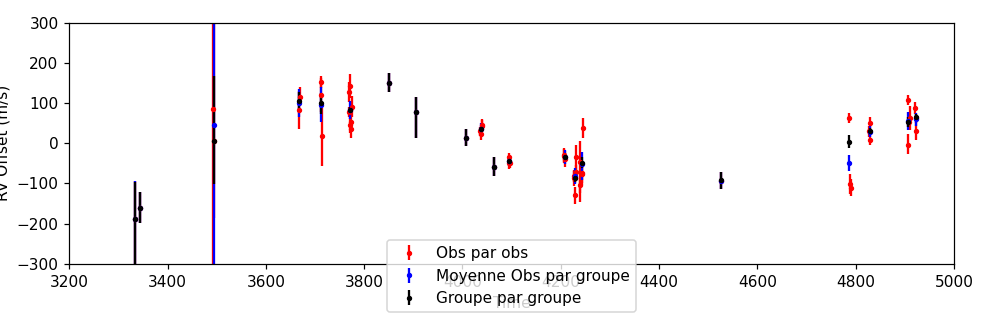

In [37]:
rv_time = rv_data[:,0]
index = np.argwhere(rv_time>=3333)
rv_time = np.ndarray.flatten(rv_time[index])
results = np.loadtxt("res_TESS_20_21_2_RV_single_obs.txt",usecols=(0,1,6,13,14),skiprows=1)
groups_moy_results = np.loadtxt("res_TESS_20_21_2_RV_groups_moy_single_obs.txt",usecols=(0,1,6,13,14),skiprows=1)
groups_results = np.loadtxt("res_TESS_20_21_2_RV_groups_obs.txt",usecols=(0,1,6,13,14),skiprows=1)
plt.figure(figsize=(9,3))
rv_time_plot_obs = np.array([])
rv_time_plot_grp = np.array([])
for i in range(len(results)) :
    mean_time_obs = np.mean(rv_time[np.argwhere((rv_time>results[i][0])&(rv_time<results[i][1]))])   
    rv_time_plot_obs = np.append(rv_time_plot_obs,mean_time_obs)
    
for j in range(len(groups_results)) :
    mean_time_grp = np.mean(rv_time[np.argwhere((rv_time>groups_results[j][0])&(rv_time<groups_results[j][1]))])
    rv_time_plot_grp = np.append(rv_time_plot_grp,mean_time_grp)
    
plt.errorbar(rv_time_plot_obs,results[:,2]*1000,yerr=[results[:,3]*1000,results[:,4]*1000],fmt='.r',markersize=5,capsize=0,label="Obs par obs")
plt.errorbar(rv_time_plot_grp,groups_moy_results[:,2]*1000,yerr=[groups_moy_results[:,3]*1000,groups_moy_results[:,4]*1000],fmt='.b',markersize=5,capsize=0,label="Moyenne Obs par groupe")
plt.errorbar(rv_time_plot_grp,groups_results[:,2]*1000,yerr=[groups_results[:,3]*1000,groups_results[:,4]*1000],fmt='.k',markersize=5,capsize=0,label="Groupe par groupe")
plt.xlim(3200,5000)
plt.ylim(-300,300)
plt.legend(bbox_to_anchor=(0.5,-0.05),loc='center')
plt.tight_layout()
plt.xlabel("Time")
plt.ylabel("RV Offset (m/s)")
plt.savefig(dir+"Offsets_20_21_2_RV.pdf",bbox_inches="tight")
plt.show()